In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import gensim
import gensim.corpora as corpora
from collections import Counter

In [2]:
data_path = os.getcwd()
data_path_pre = data_path 
if not os.path.isdir(data_path_pre):
    os.mkdir(data_path_pre)
data_path_pre

'c:\\Users\\Fuzzy\\Desktop\\yi\\proposal\\formal'

In [3]:
df = pd.read_csv('wos_patent.csv')
print(df.columns)

print("------------------------------------")
print(" ")

Abstract = df['Abstract'].values.tolist()
Title = df['Article Title'].values.tolist()
print(Title)
print(Abstract)

Index(['Article Title', 'Keywords', 'Abstract', 'Publication Year',
       'Research Areas', 'label'],
      dtype='object')
------------------------------------
 
["Mr Skemp's preposterous provision: the drafting of the Patents Act 1977 and harmonization in the 1970s", 'The law applicable to the right of priority from a European perspective', 'An Intellectual Property Primer for Nanomedical Researchers and Engineers', 'The devil is in the divisional: an analysis of divisional patents, deadlines, declarations and suggestions for future practice', 'Incorporation of competition-related TRIPS flexibilities in the domestic law: A case study of India', "The compliance of South Africa's patents compulsory licensing regime to the TRIPs Agreement", 'Minutes of Evidence of the Select Committee on the Letters Patent for Invention Act 1835', 'Commercial Law', "The Herchel Smith Intellectual Property Lecture 2022*The UK courts' striving for consistency with international decisions in patent law", 

In [4]:
import pandas as pd

# 讀取 CSV 文件
df = pd.read_csv('wos_patent.csv')

# 填充 Abstract 和 Title 列中的 NaN 值為空字串，並將元素轉換為字串
Abstract = df['Abstract'].fillna('').astype(str).values.tolist()
Title = df['Article Title'].fillna('').astype(str).values.tolist()

# 將 Title 和 Abstract 列內容連接，並生成最終數據
data = [f'{Title[i]}. {Abstract[i]}' for i in range(len(Abstract))]

# 打印結果
for item in data:
    print(item)


Mr Skemp's preposterous provision: the drafting of the Patents Act 1977 and harmonization in the 1970s. The Patents Act 1977 created a new law of patents based on the European Patent Convention (1973). However, the wording of the Act did not 'copy out' the text of the Convention, but was drafted in traditional statutory language to give it effect. Nevertheless, to facilitate harmonization, the Act included a unique provision in British law: section 130(7). Both the drafter's approach and this 'preposterous' provision have been lamented by the patent judiciary for nearly four decades. But is this criticism fair?
The law applicable to the right of priority from a European perspective. The right of priority established in the Paris Convention for the Protection of Industrial Property allows a patent applicant to claim the filing date of a first application for any subsequent applications for the same invention filed within twelve months in another Paris Convention Contracting State. This 

In [5]:
data_lemmatized = np.load(rf'{data_path}\\corpus\\data_lemmatized.npy',allow_pickle=True)
id2word         = np.load(rf'{data_path}\\corpus\\id2word.npy',allow_pickle=True)
corpus          = np.load(rf'{data_path}\\corpus\\word_count_corpus_pmi_tfidf.npy',allow_pickle=True).tolist()
cp              = np.load(rf'{data_path}\\corpus\\word_count.npy',allow_pickle=True)

id2word = corpora.Dictionary(data_lemmatized)

In [ ]:
from sentence_transformers import SentenceTransformer
BERT    = "sentence-transformers/msmarco-bert-base-dot-v5"
RoBERTa = "all-roberta-large-v1"

In [7]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_model = TfidfVectorizer(stop_words="english")

from bertopic.vectorizers import ClassTfidfTransformer

ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

In [8]:
from bertopic import BERTopic

# 將每個文檔轉換為字符串（如果不是字符串的話）
data_lemmatized = [str(doc) for doc in data_lemmatized]
data_lemmatized


["['patents', '1977', 'create', 'law', 'of', 'patent', 'base', 'european', 'patent', 'convention', '1973', 'wording', 'of', 'copy', 'text', 'of', 'convention', 'draft', 'traditional', 'statutory_language', 'facilitate', 'harmonization', 'unique', 'provision', 'british', 'law', '130', '7', 'drafter', 'approach', 'preposterous', 'provision', 'lament', 'patent', 'judiciary', 'decade', 'criticism', 'fair']",
 "['of', 'priority', 'establish', 'paris_convention', 'protection', 'of', 'industrial_property', 'patent', 'applicant', 'claim', 'filing', 'of', 'application', 'subsequent', 'application_file', 'twelve_month', 'paris_convention', 'contracting', 'claim', 'person', 'file', 'application', 'successor', 'title', 'priority_validly', 'claim', 'patent_application', 'patent', 'rely', 'reject', 'revoke_invalidate', 'national', 'regional', 'rule_govern', 'claim_priority', 'priority', 'divide_share', 'transfer_independently', 'of', 'priority', 'application', 'requirement', 'valid_transfer', 'count

In [13]:
#topic_model.save("model\\BERT_topic_model")

In [ ]:
# BERT
from bertopic import BERTopic
sentence_model = SentenceTransformer(BERT)

You try to use a model that was created with version 3.0.0.dev0, however, your version is 2.4.0. This might cause unexpected behavior or errors. In that case, try to update to the latest version.





In [13]:
umap_model = UMAP(n_neighbors=15, n_components=50, metric='cosine', random_state=42)
embeddings = umap_model.fit_transform(X_pmi)

# === 5. 使用 BERTopic with embeddings ===
topic_model = BERTopic(sentence_model,vectorizer_model=vectorizer_model,
                            ctfidf_model=ctfidf_model,
                            n_gram_range=(1, 3),
                            nr_topics="auto")  # 或指定數量，例如 nr_topics=20
topics, probs = topic_model.fit_transform(filtered_docs, embeddings)

# === 6. 顯示結果 ===
topic_info = topic_model.get_topic_info()
print(topic_info)

# Optional: 視覺化
topic_model.visualize_topics().show()

    Topic  Count                                               Name  \
0      -1    510      -1_cl_digital_economy_repair_data_exclusivity   
1       0    187                       0_coating_cell_corrosion_ali   
2       1    174  1_pto_federal_circuit_patent_assertion_claim_c...   
3       2    172    2_institutional_investor_pledge_shareholder_csr   
4       3    165  3_green_innovation_green_technology_environmen...   
..    ...    ...                                                ...   
64     63     12  63_exception_31_trips_statutory_experimental_s...   
65     64     12         64_intangible_service_sector_smfh_shipping   
66     65     11        65_tax_global_minimum_taxation_bounty_claim   
67     66     11  66_examination_duration_sipo_antelope_horn_exa...   
68     67     10                          67_soil_unb_camelina_inpi   

                                       Representation  \
0   [cl, digital_economy, repair, data_exclusivity...   
1   [coating, cell, corrosion, al

### pmi+tfidf

In [ ]:
from bertopic import BERTopic
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import simple_preprocess
from gensim.corpora import Dictionary

# 假設 data_lemmatized 是你處理後的文本資料集
docs = data_lemmatized  # 使用處理過的文本資料

# 確保 docs 是字串的列表
docs = [' '.join(doc) if isinstance(doc, list) else doc for doc in docs]

# 定義你的自訂模型
embedding_model = sentence_model
vectorizer_model = vectorizer_model
ctfidf_model = ctfidf_model

# 建立一個儲存主題數與 CV 值的字典
coherence_values = {}

# 對文件進行簡單的預處理與斷詞
tokenized_docs = [simple_preprocess(doc) for doc in docs]  # 現在應該是字串列表

# 建立字典與語料庫
id2word = Dictionary(tokenized_docs)  # 建立字典
corpus = [id2word.doc2bow(doc) for doc in tokenized_docs]  # 建立語料庫

# 設定主題數的起始值、步長與上限
start = 10  # 起始值
step = 5   # 每次增加的步長
limit = 100  # 主題數量的上限

# 循環從 start 開始，遞增至 limit，步長為 step
for num_topics in range(start, limit + 1, step):
    # 建立帶有自訂參數的 BERTopic 模型，並設定期望的主題數
    topic_model1 = BERTopic(embedding_model=embedding_model,
                            vectorizer_model=vectorizer_model,
                            ctfidf_model=ctfidf_model,
                            n_gram_range=(1, 3),
                            nr_topics=num_topics)
    
    # 訓練模型
    topics1, _ = topic_model1.fit_transform(docs)
    
    # 提取每個主題的關鍵字
    topic_keywords = topic_model1.get_topics()

    # 處理可能回傳空值的情況，確保主題有效
    topic_words = []
    for topic in range(len(topic_keywords)):
        topic_data = topic_model1.get_topic(topic)
        if topic_data:  # 如果主題存在
            topic_words.append([word for word, _ in topic_data])
    
    # 檢查是否有有效的主題
    if len(topic_words) > 0:
        # 計算 Coherence Value，使用已生成的 corpus 和 id2word
        coherence_model = CoherenceModel(topics=topic_words, 
                                          texts=tokenized_docs,  # 使用斷詞後的文本資料
                                          dictionary=id2word, 
                                          corpus=corpus,  # 確保這裡的 corpus 是正確的
                                          coherence='c_v')
        
        # 計算 Coherence Value
        cv_score = coherence_model.get_coherence()
    else:
        cv_score = 0  # 如果沒有主題，設為預設值
    
    # 將結果存入字典
    coherence_values[num_topics] = cv_score
    print(f"Number of topics: {num_topics}, Coherence Value (CV): {cv_score}")

# 輸出所有主題數的 CV 值
print(coherence_values)


Number of topics: 10, Coherence Value (CV): 0.5763522853515758
Number of topics: 15, Coherence Value (CV): 0.5803677361700611
Number of topics: 20, Coherence Value (CV): 0.6120588137173363
Number of topics: 25, Coherence Value (CV): 0.5970256397144843
Number of topics: 30, Coherence Value (CV): 0.5379555320373639
Number of topics: 35, Coherence Value (CV): 0.5358394649601795
Number of topics: 40, Coherence Value (CV): 0.5533754847926883
Number of topics: 45, Coherence Value (CV): 0.5119017142608189
Number of topics: 50, Coherence Value (CV): 0.48158578601938773
Number of topics: 55, Coherence Value (CV): 0.5093418003850849
Number of topics: 60, Coherence Value (CV): 0.4736887594001355
Number of topics: 65, Coherence Value (CV): 0.45466981433053477
Number of topics: 70, Coherence Value (CV): 0.4700341591899614
Number of topics: 75, Coherence Value (CV): 0.4600818354734009
Number of topics: 80, Coherence Value (CV): 0.47823226326554447
Number of topics: 85, Coherence Value (CV): 0.471221

{10: 0.5763522853515758, 15: 0.5803677361700611, 20: 0.6120588137173363, 25: 0.5970256397144843, 30: 0.5379555320373639, 35: 0.5358394649601795, 40: 0.5533754847926883, 45: 0.5119017142608189, 50: 0.48158578601938773, 55: 0.5093418003850849, 60: 0.4736887594001355, 65: 0.45466981433053477, 70: 0.4700341591899614, 75: 0.4600818354734009, 80: 0.47823226326554447, 85: 0.4712219956719926, 90: 0.45262975492650587, 95: 0.4428373575589639, 100: 0.4856230290559899}


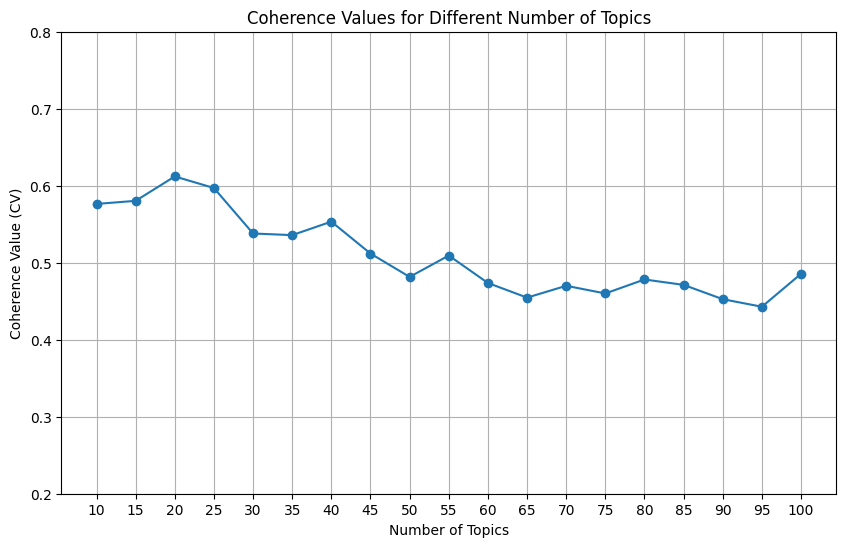

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# ...（前面的程式碼保持不變）

# 輸出所有主題數的 CV 值
print(coherence_values)

coherence_df = pd.DataFrame(list(coherence_values.items()), columns=['Number of Topics', 'Coherence Value (CV)'])

# 繪製折線圖
plt.figure(figsize=(10, 6))
plt.plot(coherence_df['Number of Topics'], coherence_df['Coherence Value (CV)'], marker='o')
plt.title('Coherence Values for Different Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Value (CV)')
plt.ylim(0.2, 0.8)
plt.xticks(coherence_df['Number of Topics'])
plt.grid()
plt.savefig('bothresult//coherence_score_加強.png')  # 儲存為 PNG 檔案
plt.show()


In [ ]:
# 初始化 DataFrame
df_coh_cv = pd.DataFrame(columns=['Num Topics', 'CV'])

# 將 Num Topics 和 Coherence Value 添加到 DataFrame 中
for num_topics, cv in coherence_values.items():
    pd_cv = pd.DataFrame({'Num Topics': [num_topics], 'CV': [cv]})
    df_coh_cv = pd.concat([df_coh_cv, pd_cv], ignore_index=True)

# 將結果儲存為 CSV 檔案
df_coh_cv.to_csv('bothresult//bertopic_coherence_value加強.csv', index=False)

# 列印 DataFrame
print(df_coh_cv)


   Num Topics        CV
0          10  0.576352
1          15  0.580368
2          20  0.612059
3          25  0.597026
4          30  0.537956
5          35  0.535839
6          40  0.553375
7          45  0.511902
8          50  0.481586
9          55  0.509342
10         60  0.473689
11         65  0.454670
12         70  0.470034
13         75  0.460082
14         80  0.478232
15         85  0.471222
16         90  0.452630
17         95  0.442837
18        100  0.485623


In [20]:
len(topic_words)

56

In [ ]:
import os
import pandas as pd

# 獲取主題資訊
topic_info = topic_model1.get_topic_info()

# 建立一個新欄位來儲存每個主題的前 20 個詞彙
topic_words = []

# 遍歷每個主題，提取前 20 個詞彙
for topic_num in topic_info['Topic']:
    if topic_num == -1:  # 排除不屬於任何主題的雜訊
        topic_words.append('No words')
    else:
        words = topic_model1.get_topic(topic_num)  # 獲取該主題的詞彙及權重
        top_words = [word for word, _ in words[:20]]  # 抓取前 20 個詞彙
        topic_words.append(", ".join(top_words))  # 將前 20 個詞彙合併為字串

# 將抓取的詞彙添加到 topic_info 中作為新欄位
topic_info['Top 20 Words'] = topic_words

# 指定儲存的資料夾路徑（可選）
folder_path = "C:\\Users\\Fuzzy\\Desktop\\yi\\proposal\\formal\\bothresult"

# 如果資料夾不存在，則建立該資料夾
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# 儲存主題資訊到 CSV 檔案
csv_file_path = os.path.join(folder_path, 'topic_info1.csv')
topic_info.to_csv(csv_file_path, index=False)

print(f"主題資訊已成功儲存至 {csv_file_path}.")


Topic information saved successfully at C:\Users\Fuzzy\Desktop\yi\proposal\formal\bothresult\topic_info1.csv.


In [ ]:
# 找到最高的一致性得分及其對應的主題數量
max_topics = max(coherence_values, key=coherence_values.get)  # 獲取最高得分對應的主題數量
max_cv_score = coherence_values[max_topics]  # 獲取最高得分

# 列印結果
print(f"最高一致性得分為: {max_cv_score}，對應的主題數量為: {max_topics}")


最高一致性得分为: 0.5353931581188166，对应的主题数量为: 15


In [28]:
data_path = os.getcwd()
data_path_TM = data_path 
if not os.path.isdir(data_path_TM):
    os.mkdir(data_path_TM)
data_path_TM

'c:\\Users\\Fuzzy\\Desktop\\yi\\proposal\\formal'

In [ ]:
from gensim import corpora
import numpy as np

# 載入資料集
data_lemmatized = np.load(rf'{data_path}\\corpus\\data_lemmatized.npy', allow_pickle=True)

# 確認 data_lemmatized 是一個列表的列表（每個子列表是斷詞後的文本）
如果 isinstance(data_lemmatized, np.ndarray):
    data_lemmatized = data_lemmatized.tolist()  # 將 numpy 陣列轉換為列表格式

# 確保 id2word 是正確的字典物件
id2word = corpora.Dictionary(data_lemmatized)  # 使用斷詞後的文本建立字典

# 載入語料庫
corpus = np.load(rf'{data_path}\\corpus\\word_count_corpus_pmi_tfidf.npy', allow_pickle=True).tolist()

# 檢查 id2word 是否正確生成
print(type(id2word))  # 應該輸出 <class 'gensim.corpora.dictionary.Dictionary'>
print(type(corpus))   # 應該輸出 <class 'list'>


<class 'gensim.corpora.dictionary.Dictionary'>
<class 'list'>


In [45]:
fig_barchart = topic_model1.visualize_barchart()
fig_barchart.update_layout(width=1000)  # Adjust the size as needed
fig_barchart.show()

In [46]:
topic_model1.visualize_topics()


In [ ]:
import pandas as pd

# 假設 topics1 是一個包含文件對應主題編號的列表
# probs1 是一個包含每份文件所屬主題的機率的陣列

# 建立 DataFrame
df = pd.DataFrame({'Document': range(len(topics1)),  # 文件編號
                   'Topic': topics1,                 # 每篇文件的主題編號
                   'Probability': probs1})           # 每篇文件的主題機率

# 顯示生成的表格
print(df)


      Document  Topic  Probability
0            0     -1     0.000000
1            1     -1     0.000000
2            2     46     0.838958
3            3     55     1.000000
4            4      4     0.217492
...        ...    ...          ...
4008      4008     51     1.000000
4009      4009     50     0.823564
4010      4010     11     0.000000
4011      4011     -1     0.717035
4012      4012     35     1.000000

[4013 rows x 3 columns]


In [ ]:
from bertopic import BERTopic

# 將每個文件轉換為字串（如果原本不是字串的話）
data_lemmatized = [str(doc) for doc in data_lemmatized]
data_lemmatized


["['patents', '1977', 'create', 'law', 'of', 'patent', 'base', 'european', 'patent', 'convention', '1973', 'wording', 'of', 'copy', 'text', 'of', 'convention', 'draft', 'traditional', 'statutory_language', 'facilitate', 'harmonization', 'unique', 'provision', 'british', 'law', '130', '7', 'drafter', 'approach', 'preposterous', 'provision', 'lament', 'patent', 'judiciary', 'decade', 'criticism', 'fair']",
 "['of', 'priority', 'establish', 'paris_convention', 'protection', 'of', 'industrial_property', 'patent', 'applicant', 'claim', 'filing', 'of', 'application', 'subsequent', 'application_file', 'twelve_month', 'paris_convention', 'contracting', 'claim', 'person', 'file', 'application', 'successor', 'title', 'priority_validly', 'claim', 'patent_application', 'patent', 'rely', 'reject', 'revoke_invalidate', 'national', 'regional', 'rule_govern', 'claim_priority', 'priority', 'divide_share', 'transfer_independently', 'of', 'priority', 'application', 'requirement', 'valid_transfer', 'count

In [49]:
topic_model1.get_document_info(data_lemmatized)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,"['patents', '1977', 'create', 'law', 'of', 'pa...",-1,-1_prep_cpm_sport_tfp,"[prep, cpm, sport, tfp, government_institution...","[['oracle_america', 'google_llc', 'federal_cir...",prep - cpm - sport - tfp - government_institut...,0.000000,False
1,"['of', 'priority', 'establish', 'paris_convent...",-1,-1_prep_cpm_sport_tfp,"[prep, cpm, sport, tfp, government_institution...","[['oracle_america', 'google_llc', 'federal_cir...",prep - cpm - sport - tfp - government_institut...,0.000000,False
2,"['center_dot', 'argue', 'divisional', 'patent_...",46,46_claim_construction_postaipa_parent_applicat...,"[claim_construction, postaipa, parent_applicat...","[['patent', 'promote_dissemination', 'of', 'te...",claim_construction - postaipa - parent_applica...,0.843213,False
3,"['abuse', 'of', 'patent', 'hit', 'pillar_of_co...",55,55_technical_feature_solicitor_earnout_grantba...,"[technical_feature, solicitor, earnout, grantb...","[['code_of_civil', 'procedure', '138', 'patent...",technical_feature - solicitor - earnout - gran...,1.000000,False
4,"['south_africa', 'patent', 'compulsory_licence...",4,4_indigenous_maori_theft_of_trade_secret_nagoy...,"[indigenous, maori, theft_of_trade_secret, nag...","[['emergence_dominance', 'of', 'knowledgebased...",indigenous - maori - theft_of_trade_secret - n...,0.362414,False
...,...,...,...,...,...,...,...,...
4008,"['collaborative_ideation', 'key', 'practice', ...",51,51_supplier_entrepreneurship_formal_appropriab...,"[supplier, entrepreneurship, formal_appropriab...","[['purpose', 'base', 'sample', 'of', 'european...",supplier - entrepreneurship - formal_appropria...,1.000000,False
4009,"['intellectual_property', 'crucial', 'developm...",50,50_ip_commercialisation_export_ip_treaty_linka...,"[ip_commercialisation, export, ip_treaty, link...","[['commercialisation', 'of', 'intellectual_pro...",ip_commercialisation - export - ip_treaty - li...,0.748667,False
4010,"['continue', 'protect', 'food', 'fiber', 'prod...",11,11_land_crop_protection_pesticide_yoruba,"[land, crop_protection, pesticide, yoruba, afb...","[['participatory_domestication', 'of', 'agrofo...",land - crop_protection - pesticide - yoruba - ...,0.775763,False
4011,"['construct', 'duopolistic', 'trade', 'model',...",-1,-1_prep_cpm_sport_tfp,"[prep, cpm, sport, tfp, government_institution...","[['oracle_america', 'google_llc', 'federal_cir...",prep - cpm - sport - tfp - government_institut...,0.000000,False


In [ ]:
# 確保資料預處理後的文本是有效的
print(data_lemmatized[:5])  # 列印前五個已處理的文本

# 檢查主題的數量和內容
print(f"Number of topics: {len(topic_words)}")
for idx, words in enumerate(topic_words):
    print(f"Topic {idx}: {words}")


["['patents', '1977', 'create', 'law', 'of', 'patent', 'base', 'european', 'patent', 'convention', '1973', 'wording', 'of', 'copy', 'text', 'of', 'convention', 'draft', 'traditional', 'statutory_language', 'facilitate', 'harmonization', 'unique', 'provision', 'british', 'law', '130', '7', 'drafter', 'approach', 'preposterous', 'provision', 'lament', 'patent', 'judiciary', 'decade', 'criticism', 'fair']", "['of', 'priority', 'establish', 'paris_convention', 'protection', 'of', 'industrial_property', 'patent', 'applicant', 'claim', 'filing', 'of', 'application', 'subsequent', 'application_file', 'twelve_month', 'paris_convention', 'contracting', 'claim', 'person', 'file', 'application', 'successor', 'title', 'priority_validly', 'claim', 'patent_application', 'patent', 'rely', 'reject', 'revoke_invalidate', 'national', 'regional', 'rule_govern', 'claim_priority', 'priority', 'divide_share', 'transfer_independently', 'of', 'priority', 'application', 'requirement', 'valid_transfer', 'countr

In [ ]:
import csv
# 獲取主題資料
topics = topic_model1.get_topics()

# 定義目標資料夾路徑
output_dir = "C:\\Users\\Fuzzy\\Desktop\\yi\\proposal\\formal\\bothresult"

# 確保目標資料夾存在，如果不存在則建立它
os.makedirs(output_dir, exist_ok=True)

# 定義 CSV 檔案的完整路徑（包含目標資料夾）
csv_filename = os.path.join(output_dir, "topics.csv")

# 開啟檔案並寫入主題資料
with open(csv_filename, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    
    # 寫入欄位名稱
    writer.writerow(["主題", "詞彙", "分數"])
    
    # 寫入每個主題及其關鍵詞與分數
    for topic_num, words in topics.items():
        for word, score in words:
            writer.writerow([f"主題_{topic_num}", word, score])

print(f"主題資料已成功匯出至 {csv_filename}")


Topic data has been successfully exported to C:\Users\Fuzzy\Desktop\yi\proposal\formal\bothresult\topics.csv


In [ ]:
# 檢查主題的數量和內容
print(f"主題數量: {len(topic_words)}")
for idx, words in enumerate(topic_words):
    print(f"主題 {idx}: {words}")


Number of topics: 67
Topic 0: ['ai', 'artificial_intelligence', 'emotional_airelate', 'ai_implementer', 'inventorship', 'ai_machine', 'ai_ruling', 'initial_set', 'data_owner', 'human_intervention']
Topic 1: ['upc', 'unified_patent_court', 'unitary_patent', 'eu', 'analytical_reflection', 'prong', 'dutch_court', 'fee_shift', 'european_jurisdiction', 'participatory']
Topic 2: ['threedimensional_shape', 'albania', 'trade_mark', 'germany_switzerland', 'eu', 'supplementary_protection_certificate', 'eu_membership', 'eu_acquis', 'separate_legal', 'eu_institution']
Topic 3: ['remanufacturer', 'remanufacturing', 'remanufacture_product', 'oem', 'closedloop_supply_chain', 'original_manufacturer', 'clsc', 'remanufacturing_degree', 'pcm', 'licensing_fee']
Topic 4: ['indigenous', 'maori', 'theft_of_trade_secret', 'nagoya_protocol', 'indigenous_people', 'rooibos', 'itk', 'traditional_knowledge', 'protect_indigenous', 'access_benefitsharing']
Topic 5: ['brazil', 'brazilian', 'hts_cable', 'bem', 'lei', 

In [ ]:
# 定義目標資料夾路徑
output_dir = "C:\\Users\\Fuzzy\\Desktop\\yi\\proposal\\formal\\bothresult"

topic_data = []
for idx, words in enumerate(topic_words):
    # 如果主題為空，顯示 'No words'，否則將詞彙轉為字串
    words_str = ', '.join(map(str, words)) if words else 'No words'
    topic_data.append([f"Topic {idx}", words_str])

# 建立 DataFrame
df = pd.DataFrame(topic_data, columns=["Topic", "Words"])

# 儲存至特定資料夾下的 CSV 檔案
csv_file_path = os.path.join(output_dir, 'topicslist.csv')
df.to_csv(csv_file_path, index=False)

print(f"CSV 檔案已成功儲存至 {csv_file_path}.")


CSV file saved successfully at C:\Users\Fuzzy\Desktop\yi\proposal\formal\bothresult\topicslist.csv.


In [ ]:
import pandas as pd
import os

# 獲取主題資訊
topic_info = topic_model1.get_topic_info()

# 儲存為 CSV 檔案
# csv_file_path = './my_folder/topic_info.csv'
csv_file_path = os.path.join(output_dir, 'topicsnum.csv')
topic_info.to_csv(csv_file_path, index=False)

print(f"主題資訊 CSV 檔案已成功儲存至 {csv_file_path}.")


Topic info CSV file saved successfully at C:\Users\Fuzzy\Desktop\yi\proposal\formal\bothresult\topicsnum.csv.


In [ ]:

# 獲取主題資訊
topic_info = topic_model1.get_topic_info()

# 指定儲存的資料夾路徑（可選）
folder_path = "C:\\Users\\Fuzzy\\Desktop\\yi\\proposal\\formal\\bothresult"

# 如果資料夾不存在，則建立該資料夾
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# 儲存主題資訊到 CSV 檔案
csv_file_path = os.path.join(folder_path, 'topic_info.csv')
topic_info.to_csv(csv_file_path, index=False)

print(f"主題資訊已成功儲存至 {csv_file_path}.")


Topic information saved successfully at C:\Users\Fuzzy\Desktop\yi\proposal\formal\bothresult\topic_info.csv.
